# SPL Manim Animations

## import

In [2]:
#from manim import *
import manim
import cv2
import numpy as np
manim.config.media_width = "60%"

Manim Community v0.14.0

## Test for LinkedIn Announcements

* Do you want to be at the forefront of Industry 4.0 development?
* Interested in playing with the latest technology?
* Are you proficient in ML Algorithms, Datascience or Embedded Systems.
* Join the Smart Process Lab Team and build the Industry of the future.
* Apply now!

In [5]:
class AnnounceSpl2022(manim.Scene):
  
  def background(self):
    self._bg = manim.ImageMobject(np.uint8([[0, 100, 30, 200], [255, 0, 5, 33]]))
    self._bg.height = 10
    # Add background
    self.add(self._bg)

  def intro(self):
    self._circle = manim.Circle(color=manim.BLUE, fill_opacity=0.5)
    self._square = manim.Square(color=manim.GREEN, fill_opacity=0.5)
    self._triangle = manim.Triangle(color=manim.RED, fill_opacity=0.5)
    
    self.play(manim.Create(self._triangle))
    self.wait()
    self.play(manim.Transform(self._triangle, self._square))
    self.wait()
    self.remove(self._triangle)
    self.play(manim.Transform(self._square, self._circle))
    self.wait()
    self.remove(self._square)
    self.play(self._circle.animate.shift(2*manim.UP).scale(1))

  def logo(self, path):
    self._spl = manim.SVGMobject(path+".svg").shift(manim.UP)
    self._spl_text = manim.Text("Smart Process Lab", font_size=80).next_to(self._spl, 3*manim.DOWN)
    self._spl_link = manim.Text("https://spl.hevs.io").next_to(self._spl_text, manim.DOWN)
    #self.add(self._spl)
    #self.play(manim.FadeIn(self._spl))
    self.play(manim.DrawBorderThenFill(self._spl.scale(1.5)))
    self.play(manim.Write(self._spl_text))
    self.wait()
    self.play(self._spl.animate.shift(1*manim.UP).scale(0.5), manim.FadeOut(self._spl_text))
    self.wait()
    

  def text(self, object):
    self._label_1 = manim.Text("Do you want to be at the forefront\n    of Industry 4.0 development?").next_to(object, manim.DOWN)
    self._label_2 = manim.Text("Interested in playing with the\n          latest technology?").next_to(object, manim.DOWN)
    self._label_3 = manim.Text("\n\n\n\n\n\n\nAre you proficient in\n\n     ML Algorithms\n        Datascience\n Embedded Systems?").next_to(object, manim.DOWN)
    self._label_4 = manim.Text("   Join the Smart Process Lab Team\nand build the Industry of the future.").next_to(object, manim.DOWN)
    self._label_5 = manim.Text("       Apply now!\n\n\nhttps://hevs.ch/jobs").next_to(object, manim.DOWN)
    self.play(manim.Write(self._label_1))
    self.wait()
    self.remove(self._label_1)
    self.play(manim.Write(self._label_2))
    self.wait()
    self.remove(self._label_2)
    self.play(manim.Write(self._label_3))
    self.wait()
    self.remove(self._label_3)
    self.play(manim.Write(self._label_4))
    self.wait()
    self.play(manim.Transform(self._label_4, self._label_5))
    self.wait()
    self.wait()
    self.remove(self._label_4)
    self.play(manim.Unwrite(self._label_5))
    self.wait()

  def outro(self, object):
    #self.play(object.animate.shift(1*manim.DOWN).scale(2), manim.Write(self._spl_text))
    self.play(object.animate.scale(2), manim.Write(self._spl_text), manim.Write(self._spl_link))
    self.wait()
    self.wait()
    
  def construct(self):
    self.background()
    #self.intro()
    self.logo("img/spl-icon")
    self.text(self._spl)
    self.outro(self._spl)


## Export GIF

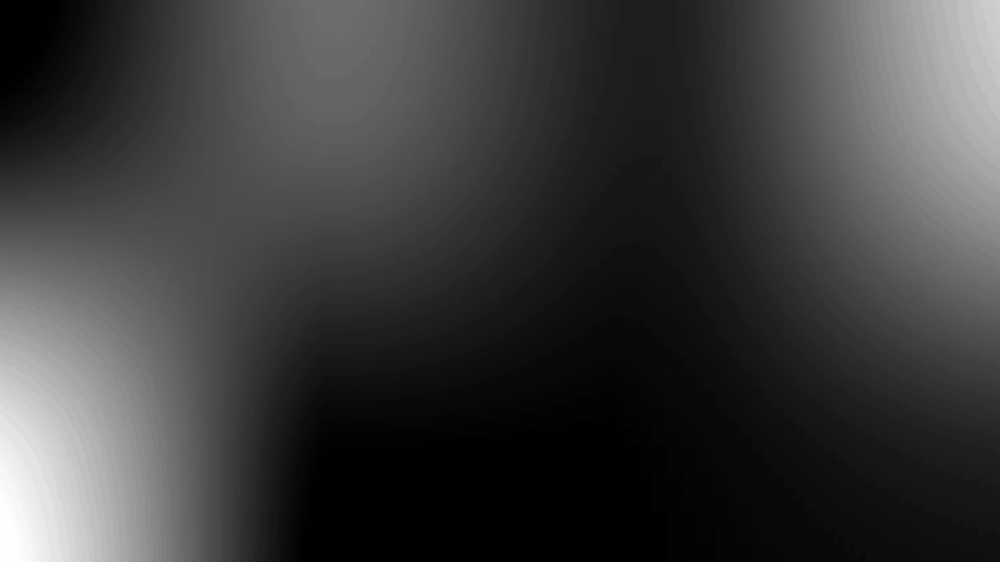

In [6]:
%%manim -v WARNING -qm --format=gif AnnounceSpl2022
#%%manim -v WARNING -qh --format=gif AnnounceSpl2022
#%%manim -v WARNING -ql --format=gif AnnounceSpl2022

announce = AnnounceSpl2022()

## Export MP4

In [7]:
%%manim -v WARNING -qh AnnounceSpl2022
#%%manim -v WARNING -qm AnnounceSpl
#%%manim -v WARNING -ql AnnounceSpl

announce = AnnounceSpl2022()

## Positioning Mobjects and moving them around

New problem: We want to create a scene in which a circle is created while simultaneously some text is written below it. We can reuse our blue circle from above, and then add some new code:

In [3]:
%%manim -v WARNING -qm HelloCircle

class HelloCircle(Scene):
    def construct(self):
        # blue_circle = Circle(color=BLUE, fill_opacity=0.5)
        # We can also create a "plain" circle and add the desired attributes via set methods:
        circle = Circle()
        blue_circle = circle.set_color(BLUE).set_opacity(0.5)
        
        label = Text("A wild circle appears!")
        label.next_to(blue_circle, DOWN, buff=0.5)
        
        self.play(Create(blue_circle), Write(label))
        self.wait()

Apparently, text can be rendered by using a `Text` Mobject – and the desired position is achieved by the line
```py
label.next_to(blue_circle, DOWN, buff=0.5)
```
Mobjects have a few methods for positioning, `next_to` is one of them (`shift`, `to_edge`, `to_corner`, `move_to` are a few others – check them out in our [documentation](https://docs.manim.community/) by using the search bar on the left!). For `next_to`, the first argument that is passed (`blue_circle`) describes next to which object our `label` should be placed. The second argument, `DOWN`, describes the direction (try changing it to `LEFT`, `UP`, or `RIGHT` instead!). And finally, `buff=0.5` controls the "buffer distance" between `blue_circle` and `label`, increasing this value will push `label` further down.

But also note that the `self.play` call has been changed: it is possible to pass several animation arguments to `self.play`, they will then be played simultaneously. If you want to play them one after the other, replace the `self.play` call with the lines
```py
self.play(Create(blue_circle))
self.play(Write(label))
```
and see what happens.

By the way, Mobjects naturally also have non-positioning related methods: for example, to get our blue circle, we could also create a default one, and then set color and opacity:
```py
circle = Circle()
blue_transparent_circle = circle.set_color(BLUE)
blue_circle = blue_transparent_circle.set_opacity(0.5)
```
A shorter version of this would be
```py
blue_circle = Circle().set_color(BLUE).set_opacity(0.5)
```
For now, we will stick with setting the attributes directly in the call to `Circle`.

## Animating Method calls: the `.animate` syntax

In the last example we have encountered the `.next_to` method, one of many (!) methods that modify Mobjects in one way or the other. But what if we wanted to animate how a Mobject changes when one of these methods is applied, say, when we `.shift` something around, or `.rotate` a Mobject, or maybe `.scale` it? The `.animate` syntax is the answer to this question, let us look at an example.

In [4]:
%%manim -v WARNING -qm CircleAnnouncement

class CircleAnnouncement(Scene):
    def construct(self):
        blue_circle = Circle(color=BLUE, fill_opacity=0.5)
        announcement = Text("Let us draw a circle.")
        
        self.play(Write(announcement))
        self.wait()
        
        self.play(announcement.animate.next_to(blue_circle, UP, buff=0.5))
        self.play(Create(blue_circle))

Where we would normally use `announcement.next_to(blue_circle, UP, buff=0.5)` to position the text without animation, we can prepend `.animate` to the method call to turn the application of the method into an animation which can then be played using `self.play`. This works with all methods that modify a Mobject in some way:

In [5]:
%%manim -v WARNING -qm AnimateSyntax

class AnimateSyntax(Scene):
    def construct(self):
        triangle = Triangle(color=RED, fill_opacity=1)
        self.play(DrawBorderThenFill(triangle))
        self.play(triangle.animate.shift(LEFT))
        self.play(triangle.animate.shift(RIGHT).scale(2))
        self.play(triangle.animate.rotate(PI/3))

In the first play call the triangle is created, in the second it is shifted to the left, then in the third it is shifted back to the right and simultaneously scaled by a factor of 2, and finally in the fourth call it is rotated by an angle of $\pi/3$. Run the cell above again after modifying some of the values, or trying other methods like, e.g., `set_color`).

When looking closely at the last animation from the scene above, the rotation, you might notice that this is not *actually* a rotation. The triangle is transformed to a rotated version of itself, but during the animation the vertices of the triangle don't move along an arc (as they would when the triangle was rotated around its center), but rather along straight lines, which gives the animation the impression that the triangle first shrinks a bit and then grows again.

This is actually **not a bug**, but a consequence of how the `.animate` syntax works: the animation is constructed by specifying the starting state (the `triangle` Mobject in the example above), and the final state (the rotated mobject, `triangle.rotate(PI/3)`). Manim then tries to interpolate between these two, but doesn't actually know that you would like to smoothly rotate the triangle. The following example illustrates this clearly:

In [19]:
%%manim -v WARNING -qm DifferentRotations

class DifferentRotations(Scene):
    def construct(self):
        left_square = Square(color=BLUE, fill_opacity=0.7).shift(2*LEFT)
        right_square = Square(color=GREEN, fill_opacity=0.7).shift(2*RIGHT)
        self.play(left_square.animate.rotate(PI), Rotate(right_square, angle=PI), run_time=2)
        self.wait()

## Typesetting Mathematics

Manim supports rendering and animating LaTeX, the markup language mathematics is very often typeset in. Learn more about it [in this 30 minute tutorial](https://www.overleaf.com/learn/latex/Learn_LaTeX_in_30_minutes).

Here is a simple example for working with LaTeX in Manim:

In [20]:
%%manim -v WARNING -qm CauchyIntegralFormula

class CauchyIntegralFormula(Scene):
    def construct(self):
        formula = MathTex(r"[z^n]f(z) = \frac{1}{2\pi i}\oint_{\gamma} \frac{f(z)}{z^{n+1}}~dz")
        self.play(Write(formula), run_time=3)
        self.wait()

As this example demonstrates, `MathTex` allows to render simple (math mode) LaTeX strings. If you want to render "normal mode" LaTex, use `Tex` instead.

Of course, Manim can also help you to visualize transformations of typeset formulae. Consider the following example:

In [21]:
%%manim -v WARNING -qm TransformEquation

class TransformEquation(Scene):
    def construct(self):
        eq1 = MathTex("42 {{ a^2 }} + {{ b^2 }} = {{ c^2 }}")
        eq2 = MathTex("42 {{ a^2 }} = {{ c^2 }} - {{ b^2 }}")
        eq3 = MathTex(r"a^2 = \frac{c^2 - b^2}{42}")
        self.add(eq1)
        self.wait()
        self.play(TransformMatchingTex(eq1, eq2))
        self.wait()
        self.play(TransformMatchingShapes(eq2, eq3))
        self.wait()

In this last example, `eq1` and `eq2` have some double braces positions where, conventionally, there wouldn't be any in plain LaTeX. This is special Manim notation that groups the resulting `Tex` Mobjects `eq1` and `eq2` in a particular way.

This special notation is helpful when using the `TransformMatchingTex` animation: it will transform parts with equal TeX strings (for example, `a^2` to `a^2`) into each other – and without the special notation, the equation is considered to be one long TeX string. In comparison, `TransformMatchingShapes` is less smart: it simply tries to transform shapes that "look the same" into each other – nonetheless, it is still often very useful.

If you have made it this far, you should have a first impression of basic usage of the library. You can find a few more advanced examples that illustrate some more specialized concepts in the library below. Go ahead, try to play around and modify them just like you did for the ones above! Explore our [documentation](https://docs.manim.community) to get an idea about things that are already implemented – and look at the source code in case you want to build some more complex objects yourself.

The [community](https://www.manim.community/discord/) is certainly also happy to answer questions – and we hope you share your awesome projects with us! **Happy *manimating*!**

## Some more specialized examples

Before you delve right into these examples: please note that they illustrate specialized concepts, they are meant to give you a feeling for how more complex scenes are setup and coded. The examples don't come with additional explanation, they are **not intended as (entry level) learning resources**.

In [22]:
%%manim -v WARNING -qm FormulaEmphasis

class FormulaEmphasis(Scene):
    def construct(self):
        product_formula = MathTex(
            r"\frac{d}{dx} f(x)g(x) =",
            r"f(x) \frac{d}{dx} g(x)",
            r"+",
            r"g(x) \frac{d}{dx} f(x)"
        )
        self.play(Write(product_formula))
        box1 = SurroundingRectangle(product_formula[1], buff=0.1)
        box2 = SurroundingRectangle(product_formula[3], buff=0.1)
        self.play(Create(box1))
        self.wait()
        self.play(Transform(box1, box2))
        self.wait()

In [23]:
%%manim -v WARNING -qm PlotExample

class PlotExample(Scene):
    def construct(self):
        plot_axes = Axes(
            x_range=[0, 1, 0.05],
            y_range=[0, 1, 0.05],
            x_length=9,
            y_length=5.5,
            axis_config={
                "numbers_to_include": np.arange(0, 1 + 0.1, 0.1),
                "font_size": 24,
            },
            tips=False,
        )

        y_label = plot_axes.get_y_axis_label("y", edge=LEFT, direction=LEFT, buff=0.4)
        x_label = plot_axes.get_x_axis_label("x")
        plot_labels = VGroup(x_label, y_label)

        plots = VGroup()
        for n in np.arange(1, 20 + 0.5, 0.5):
            plots += plot_axes.plot(lambda x: x**n, color=WHITE)
            plots += plot_axes.plot(
                lambda x: x**(1 / n), color=WHITE, use_smoothing=False
            )

        extras = VGroup()
        extras += plot_axes.get_horizontal_line(plot_axes.c2p(1, 1, 0), color=BLUE)
        extras += plot_axes.get_vertical_line(plot_axes.c2p(1, 1, 0), color=BLUE)
        extras += Dot(point=plot_axes.c2p(1, 1, 0), color=YELLOW)
        title = Title(
            r"Graphs of $y=x^{\frac{1}{n}}$ and $y=x^n (n=1, 1.5, 2, 2.5, 3, \dots, 20)$",
            include_underline=False,
            font_size=40,
        )
        
        self.play(Write(title))
        self.play(Create(plot_axes), Create(plot_labels), Create(extras))
        self.play(AnimationGroup(*[Create(plot) for plot in plots], lag_ratio=0.05))

In [24]:
%%manim -v WARNING -qm ErdosRenyiGraph

import networkx as nx

nxgraph = nx.erdos_renyi_graph(14, 0.5)

class ErdosRenyiGraph(Scene):
    def construct(self):
        G = Graph.from_networkx(nxgraph, layout="spring", layout_scale=3.5)
        self.play(Create(G))
        self.play(*[G[v].animate.move_to(5*RIGHT*np.cos(ind/7 * PI) +
                                         3*UP*np.sin(ind/7 * PI))
                    for ind, v in enumerate(G.vertices)])
        self.play(Uncreate(G))

In [39]:
%%manim -v WARNING -qm CodeFromString

class CodeFromString(Scene):
    def construct(self):
        code = '''from manim import Scene, Square

class FadeInSquare(Scene):
    def construct(self):
        s = Square()
        self.play(FadeIn(s))
        self.play(s.animate.scale(2))
        self.wait()
'''
        rendered_code = Code(code=code, tab_width=4, background="window",
                            language="Python", font="Monospace")
        self.play(Write(rendered_code))
        self.wait(2)

In [25]:
%%manim -qm -v WARNING OpeningManim

class OpeningManim(Scene):
    def construct(self):
        title = Tex(r"This is some \LaTeX")
        basel = MathTex(r"\sum_{n=1}^\infty \frac{1}{n^2} = \frac{\pi^2}{6}")
        VGroup(title, basel).arrange(DOWN)
        self.play(
            Write(title),
            FadeIn(basel, shift=UP),
        )
        self.wait()

        transform_title = Tex("That was a transform")
        transform_title.to_corner(UP + LEFT)
        self.play(
            Transform(title, transform_title),
            LaggedStart(*[FadeOut(obj, shift=DOWN) for obj in basel]),
        )
        self.wait()

        grid = NumberPlane(x_range=(-10, 10, 1), y_range=(-6.0, 6.0, 1))
        grid_title = Tex("This is a grid")
        grid_title.scale(1.5)
        grid_title.move_to(transform_title)

        self.add(grid, grid_title)
        self.play(
            FadeOut(title),
            FadeIn(grid_title, shift=DOWN),
            Create(grid, run_time=3, lag_ratio=0.1),
        )
        self.wait()

        grid_transform_title = Tex(
            r"That was a non-linear function \\ applied to the grid"
        )
        grid_transform_title.move_to(grid_title, UL)
        grid.prepare_for_nonlinear_transform()
        self.play(
            grid.animate.apply_function(
                lambda p: p + np.array([np.sin(p[1]), np.sin(p[0]), 0])
            ),
            run_time=3,
        )
        self.wait()
        self.play(Transform(grid_title, grid_transform_title))
        self.wait()